## **PRODUCT CATEGORY CLASSIFICATION**

### Here, we want to develop an automatic and scalable first prototipe that helps to correctly categorize a new product in the available categories when it arrives.

This first prototipe will help us to identify in what elements we have to go deeper in order to get the best model.


## **Summary of requirements**

1. Train a model that predicts the product category for Software, Digital Software, and
Digital Video Games products using the Amazon Customer Reviews dataset.
2. Evaluate and validate your model.

In [1]:
# I checked warnings, but for the final report I prefer ignore those 
#that really does not affect the results (warnings of libraries, etc)
import warnings
warnings.simplefilter('ignore')
#import platform
#platform.architecture()[0]

In [2]:
#Further improvement: develop an enviroment
# Basic Modules
import os
import pandas as pd
import numpy as np
import boto3
import json
import matplotlib.pyplot as plt
#from sagemaker.predictor import json_deserializer

In [3]:
#MOdels
from sklearn.linear_model import LogisticRegression

In [4]:
# Modules for tokens
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

Using TensorFlow backend.


In [5]:
#my own functions
%load_ext autoreload
%autoreload 2

from utils.py_functions import *

## **DATA**
For our problem we use will three datasets from public datasets of Amazon. This datasets contains Customer Reviews fro three category of products.

* Software
* Digital Software
* Digital video games

In [6]:
'''
!mkdir /tmp/recsys/
!aws s3 cp s3://amazon-reviews-pds/tsv/amazon_reviews_us_Digital_Video_Games_v1_00.tsv.gz /tmp/recsys/
!aws s3 cp s3://amazon-reviews-pds/tsv/amazon_reviews_us_Software_v1_00.tsv.gz /tmp/recsys/
!aws s3 cp s3://amazon-reviews-pds/tsv/amazon_reviews_us_Digital_Software_v1_00.tsv.gz /tmp/recsys/
'''

'\n!mkdir /tmp/recsys/\n!aws s3 cp s3://amazon-reviews-pds/tsv/amazon_reviews_us_Digital_Video_Games_v1_00.tsv.gz /tmp/recsys/\n!aws s3 cp s3://amazon-reviews-pds/tsv/amazon_reviews_us_Software_v1_00.tsv.gz /tmp/recsys/\n!aws s3 cp s3://amazon-reviews-pds/tsv/amazon_reviews_us_Digital_Software_v1_00.tsv.gz /tmp/recsys/\n'

In [7]:
df_video_games = pd.read_csv('data/amazon_reviews_us_Digital_Video_Games_v1_00.tsv', delimiter = '\t', error_bad_lines = False)
print('Number of rows: ', df_video_games.shape)
df_software = pd.read_csv('data/amazon_reviews_us_Software_v1_00.tsv', delimiter = '\t', error_bad_lines = False)
print('Number of rows: ', df_software.shape)
df_digital_software = pd.read_csv('data/amazon_reviews_us_Digital_Software_v1_00.tsv', delimiter = '\t', error_bad_lines = False)
print('Number of rows: ', df_digital_software.shape)

Number of rows:  (144724, 15)


b'Skipping line 8021: expected 15 fields, saw 22\nSkipping line 34886: expected 15 fields, saw 22\nSkipping line 49286: expected 15 fields, saw 22\n'


Number of rows:  (341249, 15)
Number of rows:  (101836, 15)


## **Dataset columns**

* marketplace: 2-letter country
* customer_id: random identifier for a customer
* review_id: unique id for the review
* product_id: ASIN number. Unique id for product
* product_parent: the parent of that ASIN. Multiple ASINs (color or format variations of the same product) can roll up into a single parent parent.
* product_title: title/description of the product
* product_category: brad product category
* star_rating: 1 to 5 stars (review rating)
* helpful_votes: Number of helpful votes for the review
* total_votes: number of total votes the review received
* vine: Was the review written as part of the VIne program?
* verified_purchase: Was the review from a verified purchase?
* review_headline: the title of the review itself
* review_body: text of the review
* review_date: the date of the review was written.

In [8]:
df_video_games.tail()

,marketplace,customer_id,review_id,product_id,product_parent,product_title,product_category,star_rating,helpful_votes,total_votes,vine,verified_purchase,review_headline,review_body,review_date
144719,US,53011810,R2G7DI8NYXZB5R,B001AUEITS,163061733,Crazy Machines 2 [Download],Digital_Video_Games,4,2,3,N,N,Worked first try for me,"I was worried due to the 2 reviews I saw here,...",2008-12-25
144720,US,53094564,R3QRKP4DS759BP,B001AU6TQ8,801870836,Crazy Machines 1 - The Wacky Contraptions Game...,Digital_Video_Games,1,13,16,N,N,"The Software May be Great, But I'll Never Know",I downloaded this as a Christmas present for m...,2008-12-24
144721,US,37181147,R24K4C0ZC3093U,B001AUEITS,163061733,Crazy Machines 2 [Download],Digital_Video_Games,3,3,3,N,N,Some install problems but good otherwise,The previous reviewer is correct in noting tha...,2008-09-10
144722,US,18614365,R13OA3TRCM8IBM,B001AUEITS,163061733,Crazy Machines 2 [Download],Digital_Video_Games,1,20,22,N,N,Do Not Download This!,I downloaded this for my son's birthday yester...,2008-09-01
144723,US,28326760,R1PFDIHC9TM6V4,B000AQ7K4I,99419628,Emperor of the Fading Suns,Digital_Video_Games,4,4,4,N,N,Suprisingly large scale and complex strategy game,This game has all the makings of a wonderful t...,2006-08-08


## **DROP SOME COLUMNS**

In [9]:
df_digital_software = df_digital_software.drop(columns = ['marketplace', 'customer_id', 'product_parent', 'review_id', 'vine', 'review_date'])
df_software         = df_software.drop(columns = ['marketplace', 'customer_id', 'product_parent', 'review_id', 'vine', 'review_date'])
df_video_games      = df_video_games.drop(columns = ['marketplace', 'customer_id', 'product_parent', 'review_id', 'vine', 'review_date'])

In [10]:
df = pd.concat([df_digital_software, df_video_games, df_software], axis=0)
df.tail()

,product_id,product_title,product_category,star_rating,helpful_votes,total_votes,verified_purchase,review_headline,review_body
341244,0877794618,Merriam-Webster’s Medical Audio Dictionary,Software,5,5,7,N,"My name is Maeda, and I love this CR-ROM.",I am a medical student. I loved this CD-ROM v...
341245,0877794618,Merriam-Webster’s Medical Audio Dictionary,Software,5,3,5,N,I'd rather give 6 stars to this title,"I tried a Taber's, but was disappointed: he do..."
341246,B00002SV6E,Star Wars: Droid Works,Software,4,1,1,N,Droid building,You get to build droids even ones in existence...
341247,0671573535,Star Trek Borg,Software,1,0,2,N,don't buy this game,We have not been able to even run this game be...
341248,0877794618,Merriam-Webster’s Medical Audio Dictionary,Software,3,12,13,N,An Easy-to-Use Medical Dictionary with Excelle...,Merriam-Webster's Medical Audio Dictionary is ...


In [11]:
df.dtypes

product_id           object
product_title        object
product_category     object
star_rating           int64
helpful_votes         int64
total_votes           int64
verified_purchase    object
review_headline      object
review_body          object
dtype: object

### We have products that only appears one. These products may be problematic if the text data does not describe the product correctly.

In [12]:
df.groupby(['product_id', 'product_title', 'product_category'])['star_rating'].count().reset_index().sort_values('star_rating').head(15)

,product_id,product_title,product_category,star_rating
0,0028650506,BLACK MUSIC OF TWO WORLDS CD,Software,1
13274,B000LP6JMM,Zonealarm Antivirus Small Business Ed 10U,Software,1
13275,B000LPAGOY,Magic Math: Grades 1-2: Jacobson + Jennings,Software,1
30638,B00B1PFFVC,Dell Inspiron 15R (N5110) Driver Recovery and ...,Software,1
30637,B00B1PF9KO,Dell Inspiron N5050 Driver Update and Drivers ...,Software,1
30636,B00B1PETSC,Dell Inspiron 8600 Driver Update and Drivers I...,Software,1
13280,B000LRDOAA,MoviePlus,Software,1
13281,B000LRGHBS,ImpactPlus 5; High Impact Design,Software,1
30635,B00B1PESDS,Dell Studio XPS 8100 Driver Update and Drivers...,Software,1
30634,B00B1PEPJA,Dell Inspiron 660 Driver Update and Drivers In...,Software,1


## **CHECK IF WE HAVE MISSING VALUES**

We have missing data in review_headline, review_body. We have to eliminate it or fix this in order to keep going with the analysis. 

In [13]:
## check for missing values
df.isnull().sum()

product_id           0
product_title        0
product_category     0
star_rating          0
helpful_votes        0
total_votes          0
verified_purchase    0
review_headline      5
review_body          4
dtype: int64

### We can see that the na's are not at the same rows.

In [14]:

df[df.isnull().any(axis=1)]

,product_id,product_title,product_category,star_rating,helpful_votes,total_votes,verified_purchase,review_headline,review_body
3074,B00452VGXO,The Sims 3 Late Night,Digital_Video_Games,1,0,0,Y,NaN,Product code does not work.
11907,B008D7F47Q,FIFA Soccer 13,Digital_Video_Games,5,0,0,N,Five Stars,NaN
14470,B00S00IJH8,Sims 4,Digital_Video_Games,2,0,2,N,Two Stars,NaN
128119,B004VSTQ2A,Xbox Live Subscription,Digital_Video_Games,1,1,8,Y,NaN,I DID NOT BUY THIS PRODUCT SO I AM CONFUSED AS...
21683,B00MUTB2SS,McAfee 2015 Antivirus Plus 3 PC (3-Users),Software,1,1,1,Y,NaN,I am giving this one star because I am unable ...
55474,B00EOI2ND6,HRB 2011 Basic FFP Test ASIN (Formerly: Micros...,Software,4,0,0,N,Four Stars,NaN
76722,B001GL6QHS,TurboTax Deluxe Federal + State + eFile 2008,Software,4,0,0,Y,Four Stars,NaN
178530,B000M9DOTS,MorphVOX Pro - Voice Changer,Software,4,0,1,Y,NaN,Product worked was able to play with applicati...
281897,B00008NNY0,Instant CD/DVD,Software,1,0,4,N,NaN,Shortly after buying the product I had to repl...


### Fill values

In [15]:
df.review_headline.fillna(df.review_body, inplace=True)
df.review_body.fillna(df.review_headline, inplace=True)

## **Check for white strings**

In [16]:
blanks = []  # start with an empty list

for i,lb,rv in df[['product_category','review_body']].itertuples():  # iterate over the DataFrame , 'product_title', 'verified_purchase', 'review_headline'
    if type(rv)==str:            # avoid NaN values
        if rv.isspace():         # test 'review' for whitespace
            blanks.append(i)     # add matching index numbers to the list
        
print(len(blanks), 'blanks: ', blanks)

0 blanks:  []


In [17]:
blanks = []  # start with an empty list

for i,lb,rv in df[['product_title', 'review_headline']].itertuples():  # iterate over the DataFrame , 
    if type(rv)==str:            # avoid NaN values
        if rv.isspace():         # test 'review' for whitespace
            blanks.append(i)     # add matching index numbers to the list
        
print(len(blanks), 'blanks: ', blanks)  

0 blanks:  []


## **IS BALANCED?**

In [18]:
df.groupby("product_category")['product_id'].count()/df.shape[0]

product_category
Digital_Software       0.173247
Digital_Video_Games    0.246209
Software               0.580544
Name: product_id, dtype: float64

In [19]:
dicti = {"Digital_Software": 0, "Digital_Video_Games": 1, "Software": 2}
df['product_category_label'] = df['product_category']
df = df.replace({"product_category": dicti})

In [21]:
df.dtypes

product_id                object
product_title             object
product_category           int64
star_rating                int64
helpful_votes              int64
total_votes                int64
verified_purchase         object
review_headline           object
review_body               object
product_category_label    object
dtype: object

In [22]:
df.head()

,product_id,product_title,product_category,star_rating,helpful_votes,total_votes,verified_purchase,review_headline,review_body,product_category_label
0,B00U7LCE6A,CCleaner Free [Download],0,4,0,0,Y,Four Stars,So far so good,Digital_Software
1,B00HRJMOM4,ResumeMaker Professional Deluxe 18,0,3,0,0,Y,Three Stars,Needs a little more work.....,Digital_Software
2,B00P31G9PQ,Amazon Drive Desktop [PC],0,1,1,2,Y,One Star,Please cancel.,Digital_Software
3,B00FGDEPDY,Norton Internet Security 1 User 3 Licenses,0,5,0,0,Y,Works as Expected!,Works as Expected!,Digital_Software
4,B00FZ0FK0U,SecureAnywhere Intermet Security Complete 5 De...,0,4,1,2,Y,Great antivirus. Worthless customer support,I've had Webroot for a few years. It expired a...,Digital_Software


## CLEAN TEXT COLUMNS

In [23]:
#clean characters
df = standardize_text(df, "product_title")
df = standardize_text(df, "review_headline")
df = standardize_text(df, "review_body")

NameError: name 'standardize_text' is not defined

## **Eliminate stop words**

In [24]:
#download stopwords
import nltk
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/erikapat/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/erikapat/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [25]:
df.tail(15).head()

,product_id,product_title,product_category,star_rating,helpful_votes,total_votes,verified_purchase,review_headline,review_body,product_category_label
341234,B00002CEXA,Email Games: XCom First Alien Invasion,2,4,25,26,N,"Old game, but classic",Although XCom lacks the whiz-bang graphics of ...,Software
341235,B00002S6Z2,4th Dimension 6.5 Standard Edition,2,5,9,9,N,4D is the best relation database product on de...,The 4D world opens a plethora of opportunities...,Software
341236,B00002S6EQ,Unreal,2,4,6,12,N,Wow! So beautiful...you almost hate to blow i...,This is a great game! A little lacking on sto...,Software
341237,B00002JV50,Microsoft Windows 98 Second Edition Upgrade,2,2,21,25,N,Expensive bug fix.,For a company that has enough revenue to run a...,Software
341238,B00002S9XK,Sesame Street Get Set to Learn Ages 3-6,2,5,48,59,N,Best introduction to games for 3-5 year old,This game was the first game my son was able t...,Software


In [26]:
# Import stopwords with nltk.
from nltk.corpus import stopwords
stop = stopwords.words('english')
# Exclude stopwords with Python's list comprehension and pandas.DataFrame.apply.
df['product_title'] = df['product_title'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
df['review_headline'] = df['review_headline'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
df['review_body'] = df['review_body'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
#more cleaning
df['product_title'] = df['product_title'].map(lambda x : clean_text(x))
df['review_headline'] = df['review_headline'].map(lambda x : clean_text(x))
df['review_body'] = df['review_body'].map(lambda x : clean_text(x))
df['product_title'] = df['product_title'].map(lambda x : removeAscendingChar(x)) 
df['review_headline'] = df['review_headline'].map(lambda x : removeAscendingChar(x)) 
df['review_body'] = df['review_body'].map(lambda x : removeAscendingChar(x)) 

NameError: name 'clean_text' is not defined

## **Lemmatization**

In [ ]:
#lemmatization
df['product_title'] = df['product_title'].map(lambda x : lemitizeWords(x))
df['review_headline'] = df['review_headline'].map(lambda x : lemitizeWords(x))
df['review_body'] = df['review_body'].map(lambda x : lemitizeWords(x))

In [ ]:
#eliminate single letters
df['product_title'] = df['product_title'].str.replace(r'\b\w\b','').str.replace(r'\s+', ' ')
df['review_headline'] = df['review_headline'].str.replace(r'\b\w\b','').str.replace(r'\s+', ' ')
df['review_body'] = df['review_body'].str.replace(r'\b\w\b','').str.replace(r'\s+', ' ')

In [ ]:
df.tail(15).head()

## **BASELINE MODEL** 

First we will develop a simple model, that we are going to use as Baseline.

For our baseline model we will do:
* Tokenizing sentences to a list of separate words
* Creating a train test split
* Inspecting our data a little more to validate results

In [ ]:
from nltk.tokenize import RegexpTokenizer

tokenizer = RegexpTokenizer(r'\w+')

df["token_product_title"] = df["product_title"].apply(tokenizer.tokenize)
df["token_review_body"] = df["review_body"].apply(tokenizer.tokenize)
df["token_review_headline"] = df["review_headline"].apply(tokenizer.tokenize)

## **Inspecting tokens**

In [ ]:
sentence_lengths_1 = descriptive_tokens(df, name = "token_product_title")
sentence_lengths_2 = descriptive_tokens(df, name = "token_review_body")
sentence_lengths_3 = descriptive_tokens(df, name = "token_review_headline")

In [ ]:
%matplotlib inline
fig= plt.figure(figsize=(10, 5)) 
plt.subplot(1, 3, 1) 
plt.xlabel('Sentence length')
plt.ylabel('Number of sentences product title')
plt.hist(sentence_lengths_1)
plt.subplot(1, 3, 2)
plt.xlabel('Sentence length')
plt.ylabel('Number of sentences review body')
plt.hist(sentence_lengths_2)
plt.subplot(1, 3, 3)
plt.xlabel('Sentence length')
plt.ylabel('Number of sentences review headline')
plt.hist(sentence_lengths_3)
plt.show()

In [ ]:
## **concatenate columns**

#We will use a concatination of columns, to see if we include review information or not

#
#df['full_text'] = df["product_title"] + " " + df["review_body"]  + " " + df["review_headline"]
df['product_title'] = df["product_title"] #+ " " + df["review_body"] #  + " " + df["review_headline"] #

In [ ]:
df.head()

## **Enter embeddings**

Machine Learning on images can use raw pixels as inputs. A way to represent text is to encode each character individually, this seems quite inadequate to represent and understand language. Our goal is to first create a useful embedding for each sentence in our dataset, and then use these embeddings to accurately predict the relevant category.

The most simplest approach is to use a **bag of words model**, and apply a machine learning algorimth (like, logistic, naive bayes, between others). A bag of words just associates an index to each word in our vocabulary, and embeds each sentence as a list of 0s, with a 1 at each index corresponding to a word present in the sentence.

## **Bag of Words**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

def cv(data):
    count_vectorizer = CountVectorizer()

    emb = count_vectorizer.fit_transform(data)

    return emb, count_vectorizer

df_corpus = df['product_title'] #df['review_headline']#df['full_text']
#df_corpus = df['review_body', 'review_headline']
df_labels = df["product_category"] 

X_train, X_test, y_train, y_test = train_test_split(df_corpus, df_labels, test_size=0.2, 
                                                                                random_state=40)


In [ ]:
y_test.value_counts()

In [ ]:
y_test.value_counts().plot('barh') 

In [ ]:
X_train_counts, count_vectorizer = cv(X_train)
X_test_counts = count_vectorizer.transform(X_test)

In [ ]:
print(X_train_counts.shape)

In [ ]:
#print(X_train_counts.todense())

## **CHI-SQUARED**

We’ve constructed a matrix, that have a lot of unique words/columns. This data configuratio will take a very long time to make predictions. We want to speed it up, so we’ll need to cut down the column count somehow. One way to do this is to pick a subset of the columns that are the most informative.

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
# Find the 1000 most informative columns
selector = SelectKBest(chi2, k=1000) #further work:check other alternatives
selector.fit(X_train_counts, y_train)
top_words = selector.get_support().nonzero()

# Pick only the most informative columns in the data.
chi_matrix = X_train_counts[:,top_words[0]]

In [ ]:
print(chi_matrix.shape)

In [ ]:
X_train_counts = chi_matrix.copy()

In [ ]:
print(X_train_counts.shape)

In [ ]:
#TOP WORDS FOR TEST
X_test_counts = X_test_counts[:,top_words[0]]

In [ ]:
print(X_test_counts.shape)

## **Visualizing the embeddings**

Here, we apply linear dimensionality reduction to see if we can find separations between the groups.

In [ ]:
fig = plt.figure(figsize=(10, 10))          
plot_LSA(X_train_counts, y_train)
plt.show()

These embeddings don't look very cleanly separated. Let's see if we can still fit a useful model on them.

### **Fitting a classifier**
Starting with a logistic regression is a good idea. It is simple, often gets the job done, and is easy to interpret.

### **Logistic regression**

In [ ]:
# balance classes 
from sklearn.utils import class_weight
class_weights = class_weight.compute_class_weight('balanced',
                                                 np.unique(y_train),
                                                 y_train)
classes = np.unique(y_train)
class_weights = dict(zip(classes, class_weights))
class_weights

In [ ]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(C=30.0, class_weight=class_weights, #class_weight = 'balanced', 
                         solver='newton-cg', 
                         multi_class='multinomial', n_jobs=1, random_state=40) #, n_jobs=-1 (default) all, -2 all cpus but one are used
clf.fit(X_train_counts, y_train) #, class_weight=class_weights to balance data

In [50]:
y_predicted_counts = clf.predict(X_test_counts)

(array([30698.,     0.,     0.,     0.,     0., 29282.,     0.,     0.,
            0., 57582.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <a list of 10 Patch objects>)

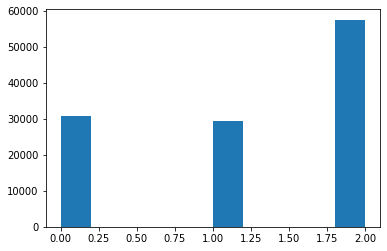

In [51]:
plt.hist(y_predicted_counts) 

### Evaluation
Let's start by looking at some metrics to see if our classifier performed well at all.

In [52]:
accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_counts)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy, precision, recall, f1))

accuracy = 0.856, precision = 0.888, recall = 0.856, f1 = 0.863


### **Inspection**
A metric is one thing, but in order to make an actionnable decision, we need to actually inspect the kind of mistakes our classifier is making. Let's start by looking at the confusion matrix.

Normalized confusion matrix


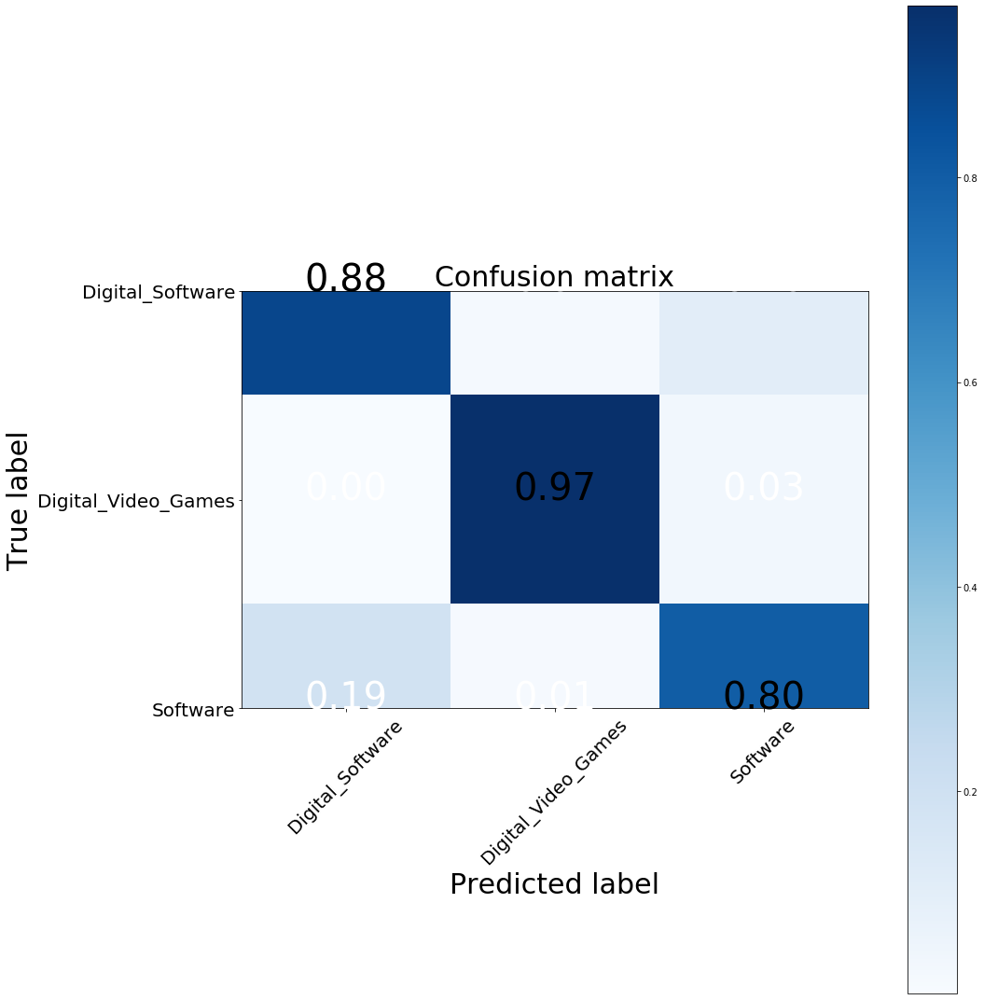

[[17864   293  2107]
 [   74 28161   869]
 [12760   828 54606]]


In [53]:
cm = confusion_matrix(y_test, y_predicted_counts)
fig = plt.figure(figsize=(15, 15))
plot = plot_confusion_matrix(cm, classes=['Digital_Software', 'Digital_Video_Games', 'Software'], normalize=True, title='Confusion matrix')
plt.show()
print(cm)

In [54]:
#IMPORTANCE OF WORDS
importance = get_most_important_features(count_vectorizer, clf, 10)

In [55]:
importance[1]['tops'] #tops for video games

[(5.8721997659747975, 'advertisement'),
 (6.056004926710933, 'auriculoerapy'),
 (6.067608435417419, 'acpa'),
 (6.189084280002864, 'armonica'),
 (6.366940460936444, 'anniilation'),
 (6.654794575584947, 'anvil'),
 (6.662276675378382, 'ajq'),
 (6.749679684006429, 'aboard'),
 (6.856134258149394, 'al'),
 (8.879801571394873, 'arcxt')]

In [56]:
importance[0]['tops'] #digital software

[(4.732064914147096, 'arcticlean'),
 (4.916537265320087, 'accessory'),
 (5.022995206385733, 'annie'),
 (5.149171414134906, 'abuse'),
 (5.250643295788913, 'albian'),
 (5.3368857002896295, 'anywere'),
 (5.450814857466169, 'ability'),
 (5.960461665146921, 'accurate'),
 (6.0128726237316785, 'amorpium'),
 (6.061294136122159, 'auorware')]

In [57]:
importance[2]['tops'] #software

[(4.728202879859752, 'accountz'),
 (4.747692774415891, 'amapi'),
 (4.798641640556464, 'amr'),
 (4.84254274779429, 'admirals'),
 (4.855943234965648, 'atari'),
 (5.335865550472419, 'adapter'),
 (5.635358372442225, 'arrangement'),
 (5.651636066332626, 'affiliate'),
 (5.92872288647246, 'artsy'),
 (6.144311096751719, 'attack')]

Most important words


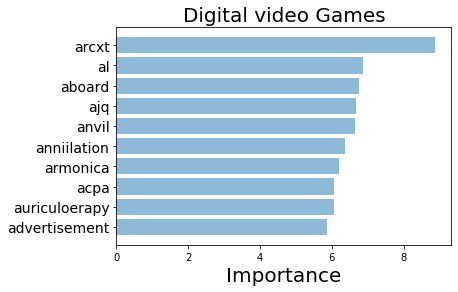

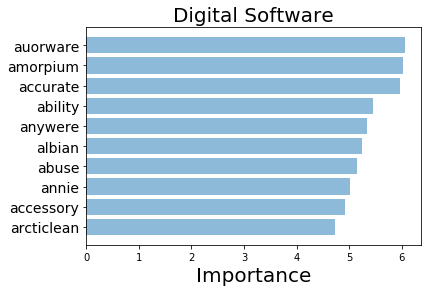

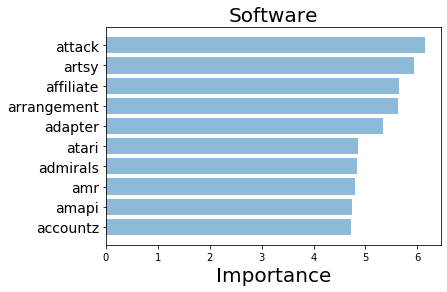

In [58]:
#video games (1)
top_scores_video = [a[0] for a in importance[1]['tops']]
top_words_video = [a[1] for a in importance[1]['tops']]
#digital software (0)
top_scores_digital = [a[0] for a in importance[0]['tops']]
top_words_digital = [a[1] for a in importance[0]['tops']]
##software
top_scores_software = [a[0] for a in importance[2]['tops']]
top_words_software = [a[1] for a in importance[2]['tops']]

print("Most important words")
plot_important_words(top_scores_video, top_words_video, name = 'Digital video Games')
plot_important_words(top_scores_digital, top_words_digital, name = 'Digital Software')
plot_important_words(top_scores_software, top_words_software, name = 'Software')

## **TFIDF Bag of Words**

Let's try a slightly more subtle approach. Now, we will use a TF-IDF (Term Frequency, Inverse Document Frequency) which means weighing words by how frequent they are in our dataset, discounting words that are too frequent (as of, the and others), because they just add noise.

In [59]:
def tfidf(data):
    tfidf_vectorizer = TfidfVectorizer()

    train = tfidf_vectorizer.fit_transform(data)

    return train, tfidf_vectorizer

X_train_tfidf, tfidf_vectorizer = tfidf(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

In [60]:
print(X_train_tfidf.shape)

(470247, 15354)


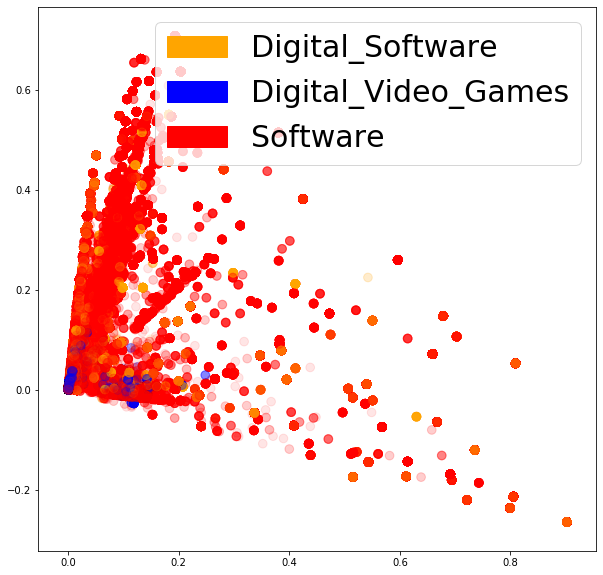

In [61]:
fig = plt.figure(figsize=(10, 10))          
plot_LSA(X_train_tfidf, y_train)
plt.show()

In [62]:
clf_tfidf = LogisticRegression(C=30.0, class_weight= class_weights,# 'balanced', 
                               solver='newton-cg', 
                         multi_class='multinomial', n_jobs=1, random_state=40)
clf_tfidf.fit(X_train_tfidf, y_train)

y_predicted_tfidf = clf_tfidf.predict(X_test_tfidf)

In [63]:
accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf = get_metrics(y_test, y_predicted_tfidf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf))

accuracy = 0.873, precision = 0.907, recall = 0.873, f1 = 0.881


Normalized confusion matrix


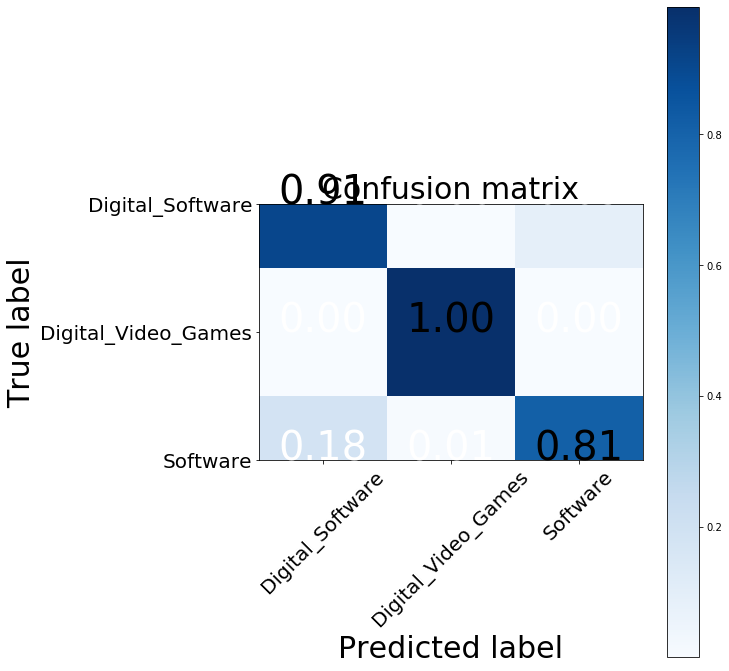

TFIDF confusion matrix
[[18421    55  1788]
 [   21 28962   121]
 [12482   411 55301]]
BoW confusion matrix
[[17864   293  2107]
 [   74 28161   869]
 [12760   828 54606]]


In [64]:
cm2 = confusion_matrix(y_test, y_predicted_tfidf)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm2, classes=['Digital_Software', 'Digital_Video_Games', 'Software'], normalize=True, title='Confusion matrix')
plt.show()
print("TFIDF confusion matrix")
print(cm2)
print("BoW confusion matrix")
print(cm)

### Looking at important coefficients of the model


In [65]:
importance_tfidf = get_most_important_features(tfidf_vectorizer, clf_tfidf, 10)

Most important words


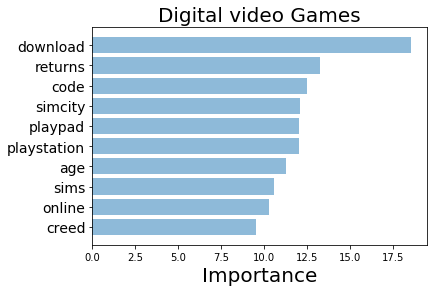

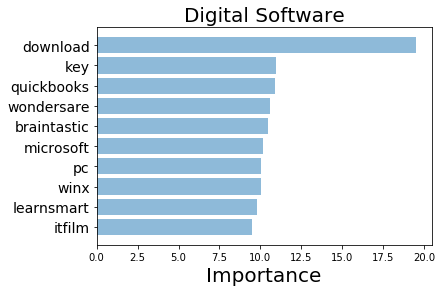

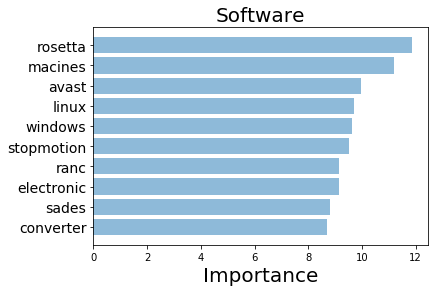

In [66]:
#video games (1)
top_scores_video = [a[0] for a in importance_tfidf[1]['tops']]
top_words_video = [a[1] for a in importance_tfidf[1]['tops']]
#digital software (0)
top_scores_digital = [a[0] for a in importance_tfidf[0]['tops']]
top_words_digital = [a[1] for a in importance_tfidf[0]['tops']]
##software
top_scores_software = [a[0] for a in importance_tfidf[2]['tops']]
top_words_software = [a[1] for a in importance_tfidf[2]['tops']]

print("Most important words")
plot_important_words(top_scores_video, top_words_video, name = 'Digital video Games') 
plot_important_words(top_scores_digital, top_words_digital, name = 'Digital Software')
plot_important_words(top_scores_software, top_words_software, name = 'Software')

The words the model picked up look much more relevant! Although our metrics on our held out validation set haven't increased much, we have much more confidence in the terms our model is using.

## **word2vec**

### Capturing semantic meaning
Our first models have managed to pick up on high signal words. However, it is unlikely that we will have a training set containing all relevant words. To solve this problem, we need to capture the semantic meaning of words. 

### Enter word2vec
Word2vec is a model that was pre-trained on a very large set of sentences, and provides embeddings that map words that are similar close to each other. A quick way to get a sentence embedding for our classifier, is to average word2vec scores of all words in our sentence.

In [67]:
#!pip install gensim
#!pip install --upgrade pip

#!wget https://github.com/mmihaltz/word2vec-GoogleNews-vectors/blob/master/GoogleNews-vectors-negative300.bin.gz

**Note:** The load_word2vec_format() method also has an optional limit argument which will only load the supplied number of vectors – so you could use limit=500000 to cut the memory requirements by about 5/6ths. (And, since the GoogleNews and other vector sets are usually ordered from most- to least-frequent words, you'll get the 500K most-frequent words. Lower-frequency words generally have much less value and even not-as-good vectors, so it may not hurt much to ignore them.)

In [68]:
import gensim
word2vec = gensim.models.KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True, limit = 100000)  

# data to introduce in the model.

In [69]:
df.head(2)

,product_id,product_title,product_category,star_rating,helpful_votes,total_votes,verified_purchase,review_headline,review_body,product_category_label,token_product_title,token_review_body,token_review_headline
0,B00U7LCE6A,ccleaner free download,0,4,0,0,Y,,far good,Digital_Software,"[ccleaner, free, download]","[far, good]",[]
1,B00HRJMOM4,resumemaker professional deluxe,0,3,0,0,Y,ree,needs little work,Digital_Software,"[resumemaker, professional, deluxe]","[needs, little, work]",[ree]


In [70]:
list_labels = df["product_category"].tolist()
df_corpus2 = df[["product_category", 'product_title', 'token_product_title']] # introduce more columns

In [71]:
embeddings = get_word2vec_embeddings(word2vec, df_corpus2, name = 'token_product_title')
X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec = train_test_split(embeddings, list_labels, 
                                                                                        test_size=0.2, random_state=40)

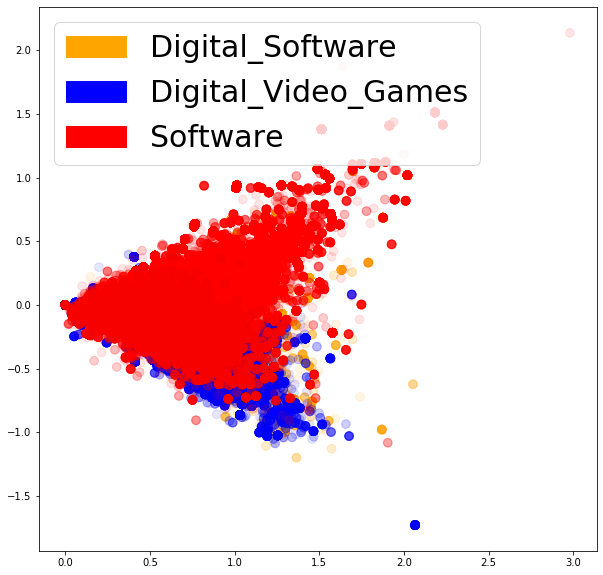

In [72]:
fig = plt.figure(figsize=(10, 10))          
plot_LSA(embeddings, list_labels)
plt.show()

These look a little bit more separated, let's see how our logistic regression does on them!

In [73]:
clf_w2v = LogisticRegression(C=30.0, class_weight = class_weights, #class_weight='balanced', 
                             solver = 'newton-cg', 
                         multi_class = 'multinomial', random_state = 40)
clf_w2v.fit(X_train_word2vec, y_train_word2vec)
y_predicted_word2vec = clf_w2v.predict(X_test_word2vec)

In [74]:
accuracy_word2vec, precision_word2vec, recall_word2vec, f1_word2vec = get_metrics(y_test_word2vec, y_predicted_word2vec)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy_word2vec, precision_word2vec, 
                                                                       recall_word2vec, f1_word2vec))

accuracy = 0.809, precision = 0.849, recall = 0.809, f1 = 0.814


Normalized confusion matrix


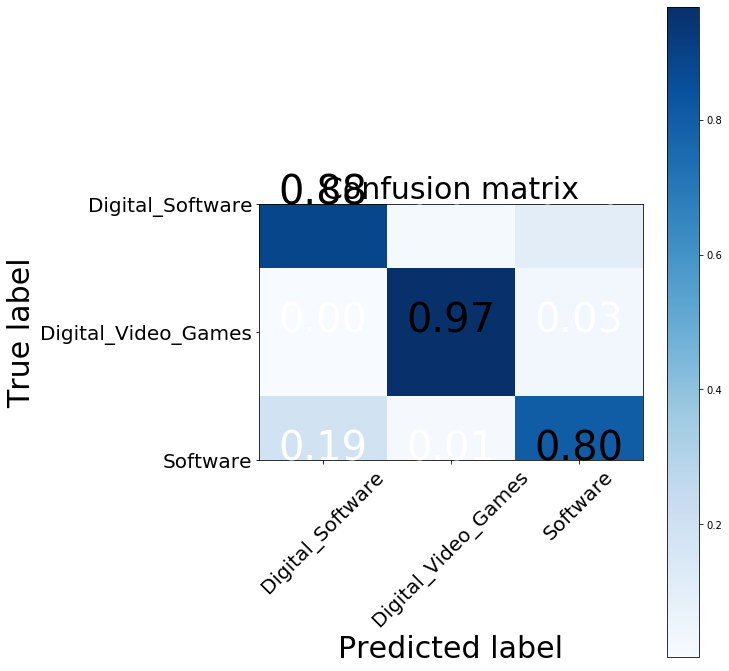

Word2Vec confusion matrix
[[17182   682  2400]
 [  338 28115   651]
 [13552  4849 49793]]
TFIDF confusion matrix
[[18421    55  1788]
 [   21 28962   121]
 [12482   411 55301]]
BoW confusion matrix
[[17864   293  2107]
 [   74 28161   869]
 [12760   828 54606]]


In [75]:
cm_w2v = confusion_matrix(y_test_word2vec, y_predicted_word2vec)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm, classes=['Digital_Software', 'Digital_Video_Games', 'Software'], normalize=True, title='Confusion matrix')
plt.show()
print("Word2Vec confusion matrix")
print(cm_w2v)
print("TFIDF confusion matrix")
print(cm2)
print("BoW confusion matrix")
print(cm)

In [76]:
# **More values for the logistic**

In [77]:
dicti_n = {0:"Digital_Software", 1:"Digital_Video_Games", 2:"Software"}

In [78]:
#clf_w2v.score(X, y)
arr = clf_w2v.predict_proba(X_test_word2vec)
df_predict= pd.DataFrame(data=arr)
df_predict.columns = ["Digital_Software", "Digital_Video_Games", "Software"]
arr = clf_w2v.predict(X_test_word2vec)
df_predict['predicted_label'] = pd.DataFrame(data=arr.flatten())
df_predict['prediction_title'] = df_predict['predicted_label'].copy()
df_predict = df_predict.replace({"prediction_title": dicti_n})
arr = np.array(y_test_word2vec)
df_predict['real_label'] = pd.DataFrame(data=arr.flatten())
df_predict["max_pred"] = df_predict[['Digital_Software', 'Digital_Video_Games','Software']].max(axis=1)
print(df_predict.shape)
df_predict.head()

(117562, 7)


,Digital_Software,Digital_Video_Games,Software,predicted_label,prediction_title,real_label,max_pred
0,0.025940,0.000846,0.973214,2,Software,2,0.973214
1,0.162306,0.463053,0.374641,1,Digital_Video_Games,2,0.463053
2,0.169370,0.000059,0.830571,2,Software,2,0.830571
3,0.528857,0.000017,0.471126,0,Digital_Software,2,0.528857
4,0.008877,0.004264,0.986858,2,Software,2,0.986858


In [79]:
df_predict[df_predict['max_pred'] <.60].tail(20)

,Digital_Software,Digital_Video_Games,Software,predicted_label,prediction_title,real_label,max_pred
117366,0.586714,0.000583,0.412702,0,Digital_Software,2,0.586714
117370,0.408311,0.104081,0.487608,2,Software,2,0.487608
117379,0.484080,0.004732,0.511189,2,Software,2,0.511189
117396,0.528857,0.000017,0.471126,0,Digital_Software,2,0.528857
117414,0.588009,0.411903,0.000087,0,Digital_Software,0,0.588009
117427,0.162306,0.463053,0.374641,1,Digital_Video_Games,1,0.463053
117434,0.162306,0.463053,0.374641,1,Digital_Video_Games,1,0.463053
117447,0.042814,0.385320,0.571866,2,Software,2,0.571866
117449,0.405033,0.004700,0.590267,2,Software,2,0.590267
117468,0.527834,0.015643,0.456522,0,Digital_Software,2,0.527834


In [80]:
df_predict_long = pd.melt(df_predict, id_vars=['predicted_label', 'prediction_title'])
df_predict_long.head()

,predicted_label,prediction_title,variable,value
0,2,Software,Digital_Software,0.025940
1,1,Digital_Video_Games,Digital_Software,0.162306
2,2,Software,Digital_Software,0.169370
3,0,Digital_Software,Digital_Software,0.528857
4,2,Software,Digital_Software,0.008877


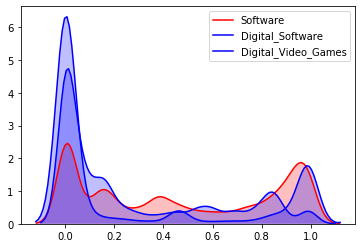

In [81]:
import seaborn as sns
sns.kdeplot(df_predict_long.loc[(df_predict_long['variable']=='Software'), 
            'value'], color='r', shade=True, Label='Software') 
sns.kdeplot(df_predict_long.loc[(df_predict_long['variable']=='Digital_Software'), 
            'value'], color='b', shade=True, Label='Digital_Software')   
sns.kdeplot(df_predict_long.loc[(df_predict_long['variable']=='Digital_Video_Games'), 
            'value'], color='b', shade=True, Label='Digital_Video_Games')  

### Further inspection
In order to provide some explainability, we can leverage a black box explainer such as LIME.

In [82]:
from lime import lime_text
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer

df_corpus = df['product_title'] #df['review_headline']#df['full_text']
#df_corpus = df['review_body', 'review_headline']
df_labels = df["product_category"] 


X_train_data, X_test_data, y_train_data, y_test_data = train_test_split(df_corpus, df_labels, test_size=0.2, 
                                                                                random_state=40)
vector_store = word2vec
def word2vec_pipeline(examples):
    global vector_store
    tokenizer = RegexpTokenizer(r'\w+')
    tokenized_list = []
    for example in examples:
        example_tokens = tokenizer.tokenize(example)
        vectorized_example = get_average_word2vec(example_tokens, vector_store, generate_missing=False, k=300)
        tokenized_list.append(vectorized_example)
    return clf_w2v.predict_proba(tokenized_list)

c = make_pipeline(count_vectorizer, clf)

In [83]:
def explain_one_instance(instance, class_names):
    explainer = LimeTextExplainer(class_names=class_names)
    exp = explainer.explain_instance(instance, word2vec_pipeline, num_features=6,  top_labels=2)
    return exp

def visualize_one_exp(features, labels, index, class_names):
    exp = explain_one_instance(features[index], class_names = class_names)
    print('Index: %d' % index)
    print('True class: %s' % class_names[labels[index]])
    exp.show_in_notebook(text=True)

In [84]:
class_names = ['Digital_Software', 'Digital_Video_Games', 'Software']
visualize_one_exp(X_test_data, y_test_data, 65, class_names)

Index: 65
True class: Software


In [85]:
visualize_one_exp(X_test_data, y_test_data, 60, class_names)

Index: 60
True class: Digital_Software


In [86]:
visualize_one_exp(X_test_data, y_test_data, 62, class_names)

Index: 62
True class: Digital_Software


In [87]:
visualize_one_exp(X_test_data, y_test_data, 68, class_names)

Index: 68
True class: Digital_Video_Games


In [88]:
visualize_one_exp(X_test_data, y_test_data, 58, class_names)

Index: 58
True class: Software


In [89]:
visualize_one_exp(X_test_data, y_test_data, 56, class_names)

Index: 56
True class: Digital_Software


In [90]:
visualize_one_exp(X_test_data, y_test_data, 52, class_names)

Index: 52
True class: Software


In [91]:
label_to_text = {
    0: "Digital_Software", 
    1: "Digital_Video_Games", 
    2: "Software"
}
random.seed(40)
#importance of words
sorted_contributions = get_statistical_explanation(X_test_data.tolist(), 100, word2vec_pipeline, label_to_text)

In [92]:
sorted_contributions

{'Digital_Software': {'bottom': deluxe       -0.007775
  essentials   -0.006164
  quickbooks   -0.002955
  ome          -0.002803
  turbotax     -0.002682
  efile        -0.002677
  publiser     -0.002596
  potosop      -0.002360
  openoffice   -0.002255
  norton       -0.002086
  internet     -0.001617
  converter    -0.001433
  back         -0.000929
  wi           -0.000665
  premiere     -0.000517
  premier      -0.000449
  programpc    -0.000447
  basic        -0.000426
  tax          -0.000378
  software     -0.000306
  mac           0.000513
  avast         0.001191
  video         0.001226
  financial     0.001455
  elements      0.001517
  user          0.002185
  federal       0.002207
  pc            0.003165
  industry      0.003212
  adobe         0.003285
  microsoft     0.005154
  pro           0.005687
  apace         0.006107
  antivirus     0.011239
  state         0.011652
  security      0.012200
  quicken       0.015116
  free          0.017359
  block         0.01

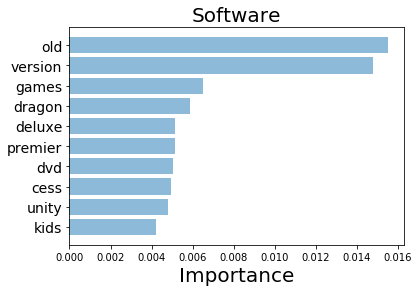

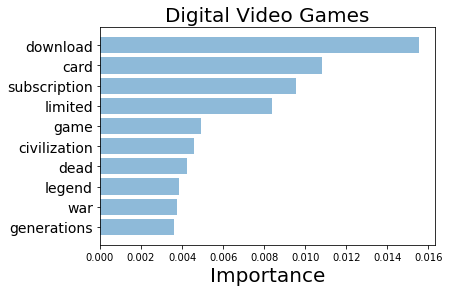

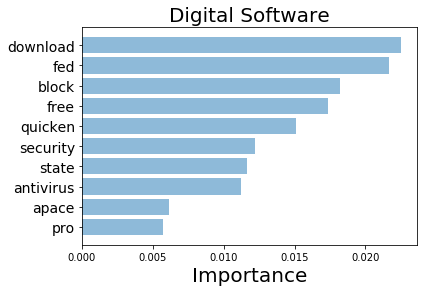

In [93]:
#Software
top_words_Software = sorted_contributions['Software']['tops'][:10].index.tolist()
top_scores_Software = sorted_contributions['Software']['tops'][:10].tolist()
top_words_GAMES = sorted_contributions['Digital_Video_Games']['tops'][:10].index.tolist()
top_scores_GAMES = sorted_contributions['Digital_Video_Games']['tops'][:10].tolist()
top_words_Digital = sorted_contributions['Digital_Software']['tops'][:10].index.tolist()
top_scores_Digital = sorted_contributions['Digital_Software']['tops'][:10].tolist()

plot_important_words(top_scores_Software, top_words_Software, "Software")
plot_important_words(top_scores_GAMES, top_words_GAMES, "Digital Video Games")
plot_important_words(top_scores_Digital, top_words_Digital, 'Digital Software')
 

## **Conclusion:**

We get better results with **TFIDF Bag of Words** option. Also, aggregate review info to the model does not help to the improvement of the results of the model that only consider 'product title'. Further analysis are required to get a better model.

## **NEXT STEPS**

### Based in the results there are several things to do to improve the results:
1. Improve the text treatment, there are words that have misspelling or not sense. More time cleaning it is necessary. Also, it is necessary to spend more time cleaning reviews (eliminate adjectives, verbs, keep only noums that can help to identify the category).
2. Use n_grams > 1. A word by itself may mean nothing, specially when we are treating with names of products.
3. This first approach was mostly exploratory, for this reason we only use logistic regression, but there are models that may help to improve the results (based tree methodologies, deep leaning, bayesian methods, between others), aditionally would be interesting combine different methodolofies using emsemble methodologies like (max voting, averaging, bagging or boosting). Compare the results with ROC curves and information criteria as AIC and BIC.
4. We can try to improve the results combining text with numerical variables. Use number of votes to give more weights to those reviews with more votes may help to find better keywords for the products. Include a label for relevant/irrelenvant information based in the available information.
5. Use Spark to speed the results.
6. Use methodologies as SMOTE to balance the data.
7. Explore other alternative to Word2Vect like: fastText GloVe or ELMO. Consider other alternatives like pre-trained NLP models to get better results, as for example BERT, ULMFIT, between others.
8. Use BlazingText’s implemetation of Word2Vec.
9. Use H2OAutoML algorithm to if we can improve the results.
10. INclude more categories to the analysis.
11. Implement the ideas wrote at the beggining to fight misclassification issues.
12. During the treatment we eliminate numbers, because we think this may aggregate noise to result. We may recheck this treatment and evaluate which may remain in the trining dataset.